# Project :Plant CLEF 2025
multi-species plant identification in vegetation plot images

# Intern : Ubaid Ur Rehman
# Supervisor : Michel RIVEILL

# Meeting 2
So What we will show in this meeting 

so we will use pre trained model `vit_base_patch14_reg4_dinov2` to predict vegetation `quadrat` images.
after all prediction we will save that prediction in submission.csv then upload in compretion platform then the comptetion organizer evaluate the `macro-averaged F1 score per sample` which is evaluate automaticaaly when we upload our submission.csv file. and for now they cannot pulish their `ground truth annotations` because they are rare and they decide to not publish for being time and may be they publish when they have some alternative test set then they will publish publicliy.

Pre Trained Model Details: https://huggingface.co/timm/vit_base_patch14_reg4_dinov2.lvd142m


So to implement this notebook we get help from this comptetion notebooks and a helping  material provided by host.


# 1. Traning Dataset
## First lets See the traning dataset in detail


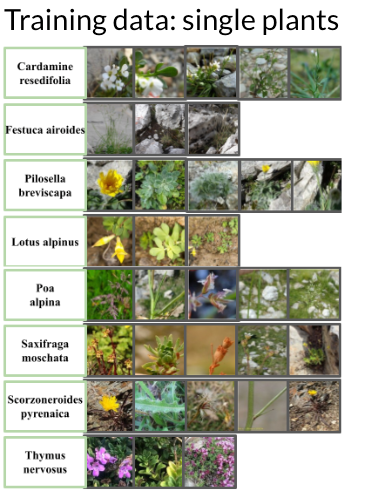

https://www.kaggle.com/competitions/plantclef-2025/overview 


##  What are the Challanges in train dataset :
So the total size of traning dataset in zip file is `166 GB` for 800 pixel image in which each images folder related to specific plant.
So the problems are 
1. Need to much storage to save the all training dataset into the laptop
2. Also need alot of time like 7 to 8 hours for extract the zip file.
3. In our case we spend only two hours and extract only 30 percent of dataset.

Lets visualize the current traning dataset by code implementiation.
 





##  Lets Print how much folder or plant species currently we have 

In [121]:
import os

path = r"E:\Ex-Hard drive\Documents\Cote Dazur University\Intern 2025\Plant CLEF\PlantCLEF2024singleplanttrainingdata_800_max_side_size\images_max_side_800"
dir_list = os.listdir(path)
folder_count = sum(os.path.isdir(os.path.join(path, entry)) for entry in dir_list)

print(f"Number of immediate subdirectories in above path is: {folder_count}")


Number of immediate subdirectories in above path is: 4638


In [117]:
images_count_array=[]
for folder_name in dir_list[:20]:# limit to the first 20 folders
    folder_path = os.path.join(path, folder_name)# construct the full path to the folder
    if os.path.isdir(folder_path):
        # count the number of images in the folder
        image_count = len([f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))])
        images_count_array.append(image_count)
        print(f"Folder: {folder_name}, Image count: {image_count}")
    else:
        print(f"Folder: {folder_name} does not exist or is not a directory.")


print(f"Average number of images in the first 20 folders: {sum(images_count_array) / len(images_count_array):.2f}")
print(f"Total number of images in the first 20 folders: {sum(images_count_array)}")

Folder: 1390963, Image count: 0
Folder: 1390966, Image count: 250
Folder: 1390967, Image count: 278
Folder: 1390972, Image count: 485
Folder: 1390979, Image count: 39
Folder: 1390981, Image count: 191
Folder: 1390993, Image count: 91
Folder: 1390995, Image count: 236
Folder: 1390997, Image count: 277
Folder: 1391007, Image count: 34
Folder: 1391023, Image count: 264
Folder: 1391025, Image count: 251
Folder: 1391028, Image count: 327
Folder: 1391037, Image count: 437
Folder: 1391044, Image count: 246
Folder: 1391053, Image count: 18
Folder: 1391054, Image count: 4
Folder: 1391070, Image count: 5
Folder: 1391074, Image count: 298
Folder: 1391077, Image count: 3
Average number of images in the first 20 folders: 186.70
Total number of images in the first 20 folders: 3734


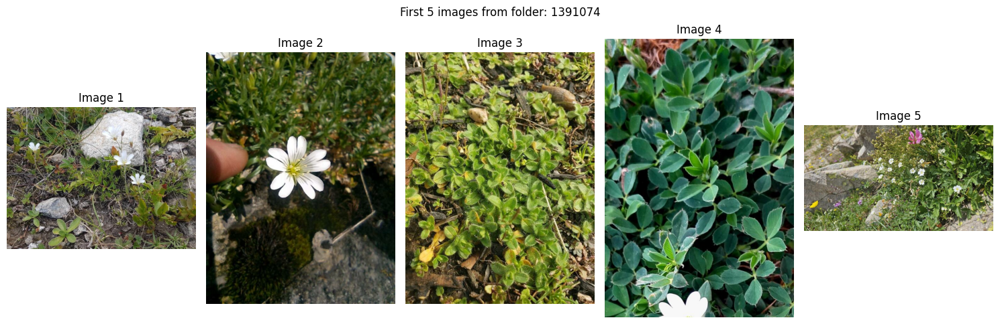

In [122]:
# import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg



# Choose the specific folder you want to display images from
specific_folder = "1391074"  # Change this to the folder you want to inspect
folder_path = os.path.join(path, specific_folder)

# Get the list of image files in the folder
image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]


# Display the first 5 images
plt.figure(figsize=(15, 5))
for i in range(min(5, len(image_files))):
    img_path = os.path.join(folder_path, image_files[i])
    img = mpimg.imread(img_path)
    plt.subplot(1, 5, i+1)
    plt.imshow(img)
    plt.title(f"Image {i+1}")
   
    plt.axis('off')


plt.suptitle(f"First 5 images from folder: {specific_folder}")
plt.tight_layout()
plt.show()


## As we have a metadata lets match this species id with its name

In [128]:
import pandas as pd
df=pd.read_csv('E:\Ex-Hard drive\Documents\Cote Dazur University\Intern 2025\My Code\PlantCLEF2024_single_plant_training_metadata.csv', sep=';', dtype={'partner': str})
df.head()

,image_name,organ,species_id,obs_id,license,partner,author,altitude,latitude,longitude,gbif_species_id,species,genus,family,dataset,publisher,references,url,learn_tag,image_backup_url
0,59feabe1c98f06e7f819f73c8246bd8f1a89556b.jpg,leaf,1396710,1008726402,cc-by-sa,NaN,Gulyás Bálint,205.9261,47.592160,19.362895,5284517.0,Taxus baccata L.,Taxus,Taxaceae,plantnet,plantnet,https://identify.plantnet.org/fr/k-southwester...,https://bs.plantnet.org/image/o/59feabe1c98f06...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...
1,dc273995a89827437d447f29a52ccac86f65476e.jpg,leaf,1396710,1008724195,cc-by-sa,NaN,vadim sigaud,323.7520,47.906703,7.201746,5284517.0,Taxus baccata L.,Taxus,Taxaceae,plantnet,plantnet,https://identify.plantnet.org/fr/k-southwester...,https://bs.plantnet.org/image/o/dc273995a89827...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...
2,416235e7023a4bd1513edf036b6097efc693a304.jpg,leaf,1396710,1008721908,cc-by-sa,NaN,fil escande,101.3160,48.826774,2.352774,5284517.0,Taxus baccata L.,Taxus,Taxaceae,plantnet,plantnet,https://identify.plantnet.org/fr/k-southwester...,https://bs.plantnet.org/image/o/416235e7023a4b...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...
3,cbd18fade82c46a5c725f1f3d982174895158afc.jpg,leaf,1396710,1008699177,cc-by-sa,NaN,Desiree Verver,5.1070,52.190427,6.009677,5284517.0,Taxus baccata L.,Taxus,Taxaceae,plantnet,plantnet,https://identify.plantnet.org/fr/k-southwester...,https://bs.plantnet.org/image/o/cbd18fade82c46...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...
4,f82c8c6d570287ebed8407cefcfcb2a51eaaf56e.jpg,leaf,1396710,1008683100,cc-by-sa,NaN,branebrane,165.3390,45.794739,15.965862,5284517.0,Taxus baccata L.,Taxus,Taxaceae,plantnet,plantnet,https://identify.plantnet.org/fr/k-southwester...,https://bs.plantnet.org/image/o/f82c8c6d570287...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...


In [129]:
# Given a species_id, get the corresponding species name from df
species_id = int(specific_folder)  # folder names are species_id as string
species_name = df.loc[df['species_id'] == species_id, 'species'].iloc[0]
print(f"Species ID: {species_id}, Species Name: {species_name}")

Species ID: 1391074, Species Name: Cerastium alpinum L.


# Now Lets Print the whole summary of train dataset 

In [130]:
# Display summary statistics and important details for the train dataset using the metadata CSV

print("Total number of images:", len(df))
print("Total unique species:", df['species_id'].nunique())
print("Total unique genus:", df['genus'].nunique())
print("Total unique families:", df['family'].nunique())
print("Total unique datasets:", df['dataset'].nunique())
print("Total unique organs (image types):", df['organ'].nunique())

print("\nSample of species distribution (top 10):")
print(df['species'].value_counts().head(10))

print("\nMissing values per important column:")
print(df[['altitude', 'latitude', 'longitude', 'author', 'license', 'organ']].isnull().sum())

print("\nExample row:")
print(df.iloc[0])

print("\nColumns available in the metadata:")
print(list(df.columns))

Total number of images: 1408033
Total unique species: 7806
Total unique genus: 1446
Total unique families: 181
Total unique datasets: 2
Total unique organs (image types): 7

Sample of species distribution (top 10):
species
Styphnolobium japonicum (L.) Schott         823
Frangula alnus Mill.                        793
Aria edulis (Willd.) M.Roem.                770
Lathyrus oleraceus Lam.                     700
Bromus sterilis L.                          674
Lotus hirsutus L.                           668
Scandosorbus intermedia (Ehrh.) Sennikov    662
Hedera helix L.                             653
Oxalis dillenii Jacq.                       653
Calicotome spinosa (L.) Link                642
Name: count, dtype: int64

Missing values per important column:
altitude     702711
latitude     702608
longitude    702609
author         2138
license           0
organ             0
dtype: int64

Example row:
image_name               59feabe1c98f06e7f819f73c8246bd8f1a89556b.jpg
organ           

# 2. Test Dataset
Now lets see the test image in detail

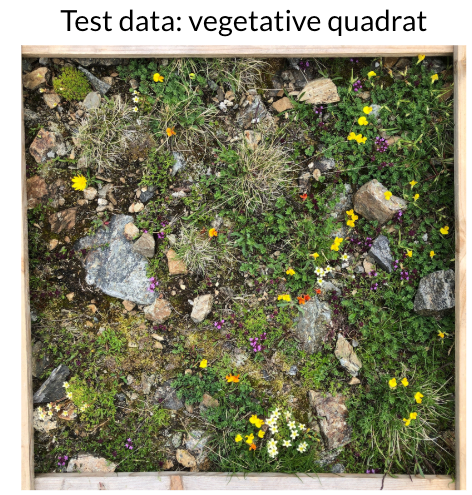

https://www.kaggle.com/competitions/plantclef-2025/overview 

## Print number of images in Test dataset folder

In [131]:


path_test = r"../Plant CLEF/PlantCLEF2025_test_images/PlantCLEF2025_test_images" # load the path to the directory
# get all images count
images = [f for f in os.listdir(path_test) if os.path.isfile(os.path.join(path_test, f)) and f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# print the number of images
print(f"Number of images in the directory: {len(images)}")



Number of images in the directory: 2105


## Display some test images


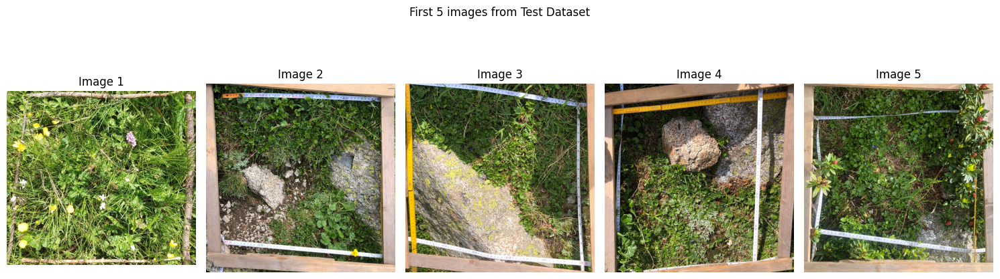

In [132]:

# Choose the specific folder you want to display images from



# Display the first 5 images
plt.figure(figsize=(15, 5))
for i in range(min(5, len(images))):
    img_path = os.path.join(path_test, images[i])
    img = mpimg.imread(img_path)
    plt.subplot(1, 5, i+1)
    plt.imshow(img)
    plt.title(f"Image {i+1}")
   
    plt.axis('off')


plt.suptitle(f"First 5 images from Test Dataset")
plt.tight_layout()
plt.show()


# How to use pre train model  for this dataset and which one ?
We will use timm library to create model
For more detail visit here :

https://huggingface.co/docs/timm/en/reference/models
https://dataloop.ai/library/model/timm_vit_base_patch14_reg4_dinov2lvd142m/ 

## Which pre train model we will use? 
we will use `vit_base_patch14_reg4_dinov2.lvd142m`  pre-trained models are based on a Vit base architecture and self-supervised learning approach DINO V2 on 142M images.


## Lets create model
we need to load species id from species_ids.csv then pass to the model in the num_classes parameter to create model 
Also we get help from `basic_usage_pretrained_model.py` to create the model

In [4]:
import timm 
import pandas as pd
species_ids =  pd.read_csv('E:\Ex-Hard drive\Documents\Cote Dazur University\Intern 2025\My Code\species_ids.csv')
model = timm.create_model('vit_base_patch14_reg4_dinov2.lvd142m',
                          pretrained=False,
                          num_classes=len(species_ids),
                          checkpoint_path=r'E:\Ex-Hard drive\Documents\Cote Dazur University\Intern 2025\Plant CLEF\PlantNet_PlantCLEF2024_pretrained_models_on_the_flora_of_south-western_europe\pretrained_models\vit_base_patch14_reg4_dinov2_lvd142m_pc24_onlyclassifier_then_all\model_best.pth.tar')
model = model.eval()

In [7]:
model.num_classes


7806

In [5]:
# get model specific transforms (normalization, resize)
data_config = timm.data.resolve_model_data_config(model)
print("Model data_config keys and values:")
for k, v in data_config.items():
    print(f"{k}: {v}")


Model data_config keys and values:
input_size: (3, 518, 518)
interpolation: bicubic
mean: (0.485, 0.456, 0.406)
std: (0.229, 0.224, 0.225)
crop_pct: 1.0
crop_mode: center


In [9]:
# from torchvision import transforms
# # https://docs.pytorch.org/vision/0.21/generated/torchvision.transforms.Compose.html 
# transform = transforms.Compose([
#     transforms.Resize(600, interpolation=transforms.InterpolationMode.BICUBIC),# interpolation means 'bicubic' for resizing for instance  
#     transforms.CenterCrop(data_config['input_size'][1:]),
#     transforms.ToTensor(),
#     transforms.Normalize(mean=data_config['mean'], std=data_config['std']),
# ])

In [6]:
# get model specific transforms (normalization, resize)

transforms = timm.data.create_transform(**data_config, is_training=False)

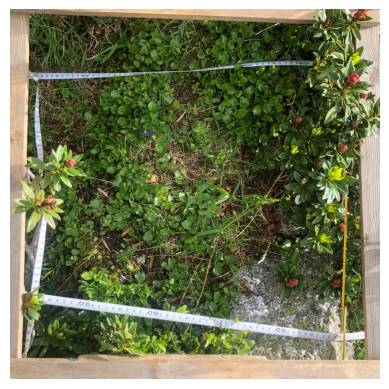

In [1]:
from PIL import Image
import matplotlib.pyplot as plt

img = Image.open(r'E:\Ex-Hard drive\Documents\Cote Dazur University\Intern 2025\Plant CLEF\PlantCLEF2025_test_images\PlantCLEF2025_test_images\CBN-can-A5-20230705.jpg')
plt.imshow(img)
plt.axis('off')
plt.show()

In [7]:

model_input_size, model_mean, model_std = data_config['input_size'][1], data_config['mean'], data_config['std']
# batch_size = 16
batch_size = 64
# print(f"Model input size: {model_input_size}, Batch size: {batch_size}")
min_score = 0.1
top_k_tile = 2
patch_size = model_input_size
stride = int(model_input_size / 2)
use_pad = True
 

In [12]:
import torchvision.transforms as T
from kornia.contrib import extract_tensor_patches, compute_padding
image_to_tensor = T.ToTensor()

image_tensor = image_to_tensor(img).unsqueeze(0)
h, w = image_tensor.shape[-2:]
# https://kornia.readthedocs.io/en/v0.6.8/_modules/kornia/contrib/extract_patches.html
pad = compute_padding(original_size=(h, w), window_size=patch_size, stride=stride) # this meth
patches = extract_tensor_patches(image_tensor, patch_size, stride, padding=pad)
print(f"Shape of image tiles = {patches.shape}")

c:\Users\HP\anaconda3\envs\tf2.7\lib\site-packages\kornia\feature\lightglue.py:44: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @torch.cuda.amp.custom_fwd(cast_inputs=torch.float32)


Shape of image tiles = torch.Size([1, 121, 3, 518, 518])


lets print specific patch

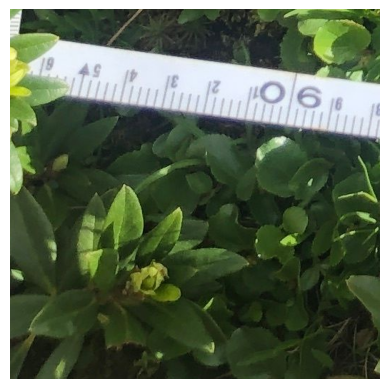

In [147]:
plt.imshow(tensor_to_image(patches[0][100])) # Display a specific patch
plt.axis('off')
plt.show()

There are 121 paches lets display them 

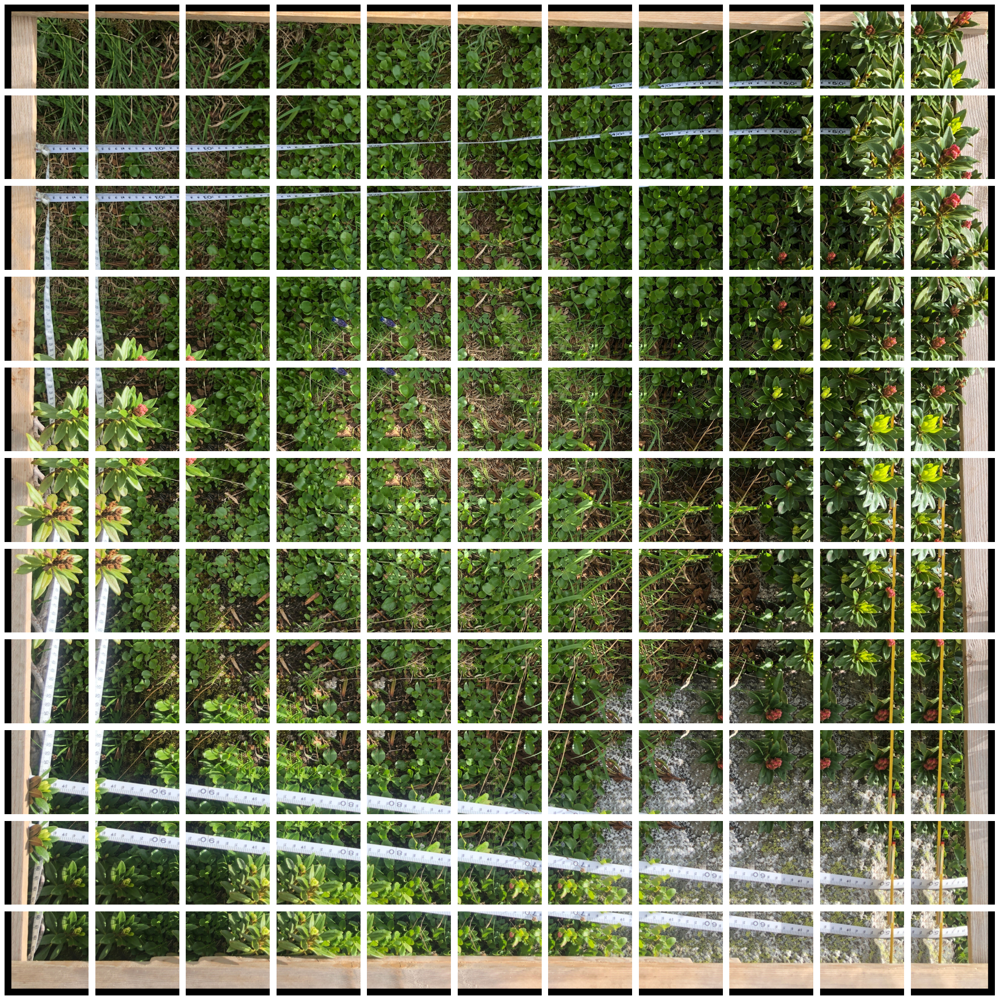

In [ ]:
import math
from kornia import tensor_to_image
import matplotlib.pyplot as plt

num_patches = patches.shape[1]  # 121
# https://developer.mozilla.org/en-US/docs/Web/JavaScript/Reference/Global_Objects/Math/ceil
cols = math.ceil(math.sqrt(num_patches))  # 11
rows = math.ceil(num_patches / cols)      # 11

fig, axs = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))
axs = axs.ravel()

for i in range(num_patches):
    axs[i].imshow(tensor_to_image(patches[0][i]))
    axs[i].set_axis_off()

# Turn off any remaining axes if grid > 121
for i in range(num_patches, len(axs)):
    axs[i].axis("off")

plt.tight_layout()
plt.show()


In [149]:
import torch
# predict on one batch only (patch #100)
img = transforms(patches[0][100]).unsqueeze(0)  # No need for tensor_to_image
# img = img.to(device)

output = model(img)  # single image batch

top5_probabilities, top5_class_indices = torch.topk(output.softmax(dim=1) * 100, k=5)
top5_probabilities = top5_probabilities.cpu().detach().numpy()
top5_class_indices = top5_class_indices.cpu().detach().numpy()

  # Map class index → species_id → species name
cid_to_spid = dict(enumerate(species_ids['species_id']))
spid_to_sp = dict(zip(df['species_id'], df['species']))

for proba, cid in zip(top5_probabilities[0], top5_class_indices[0]):
  

    species_id = cid_to_spid[cid]
    species = spid_to_sp[species_id]
    print(species_id, species, proba)


1394443 Pedicularis oederi Vahl 15.387254
1395990 Saxifraga hirculus L. 13.619408
1390764 Carex atrata L. 1.6063906
1389929 Helictochloa versicolor (Vill.) Romero Zarco 1.3971579
1360269 Rhamnus pumila Turra 1.2763722


In [152]:
from torch.utils.data import DataLoader, TensorDataset

# Automatically use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Flatten patches to create a single batch of patch images for inference
patches_tensor = patches.view(-1, *patches.shape[2:])  # shape: [num_patches, 3, H, W]

# Wrap patch tensors into a dataset and dataloader for batch-wise processing
dataset = TensorDataset(patches_tensor)
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)

# Store prediction probabilities for all patches
all_probs = []

# Set model to inference mode (disables dropout/batchnorm updates)
model.eval()

# Run inference on each batch of patches
for batch in dataloader:
    batch_patches = batch[0].to(device)  # Move data to GPU/CPU
    model.to(device)  # Move model to same device
    with torch.no_grad():  # Disable gradient tracking for faster inference
        outputs = model(batch_patches)  # Get raw logits
    probs = torch.softmax(outputs, dim=1) * 100  # Convert logits to probabilities in %
    all_probs.append(probs.cpu().numpy())  # Store results as NumPy arrays

# Concatenate predictions from all batches into a single array
all_probs = np.concatenate(all_probs, axis=0)

# Extract top-5 predicted classes and their probabilities for each patch
top5_probs, top5_indices = torch.topk(torch.tensor(all_probs), k=5, dim=1)

# Create mappings: class index → species ID → species name
cid_to_spid = dict(enumerate(species_ids['species_id']))
spid_to_name = dict(zip(df['species_id'], df['species']))

# Display top-5 predictions for each patch with species name and confidence
for i, (probs, indices) in enumerate(zip(top5_probs, top5_indices)):
    print(f"Patch {i}:")
    for prob, idx in zip(probs, indices):
        species_id = cid_to_spid[idx.item()]
        species = spid_to_name.get(species_id, "Unknown")
        print(f"  - {species} (ID: {species_id}): {prob:.2f}%")
    print()


Patch 0:
  - Hypochaeris radicata L. (ID: 1355872): 1.42%
  - Pilosella aurantiaca (L.) F.W.Schultz & Sch.Bip. (ID: 1394567): 1.20%
  - Pilosella caespitosa (Dumort.) P.D.Sell & C.West (ID: 1394571): 0.83%
  - Cerastium fontanum Baumg. (ID: 1356277): 0.76%
  - Leucanthemum ircutianum DC. (ID: 1393506): 0.69%

Patch 1:
  - Potamogeton pusillus L. (ID: 1361148): 0.29%
  - Sporobolus indicus (L.) R.Br. (ID: 1396416): 0.26%
  - Cardamine pratensis L. (ID: 1358213): 0.21%
  - Elodea nuttallii (Planch.) H.St.John (ID: 1555067): 0.20%
  - Briza media L. (ID: 1361195): 0.18%

Patch 2:
  - Cardamine pratensis L. (ID: 1358213): 0.22%
  - Nothoscordum gracile (Aiton) Stearn (ID: 1393975): 0.22%
  - Linum catharticum L. (ID: 1359592): 0.20%
  - Sporobolus indicus (L.) R.Br. (ID: 1396416): 0.17%
  - Crepis capillaris (L.) Wallr. (ID: 1355869): 0.16%

Patch 3:
  - Salix herbacea L. (ID: 1395807): 1.88%
  - Veronica serpyllifolia L. (ID: 1364066): 0.97%
  - Lysimachia nummularia L. (ID: 1393708): 0.8

# Predict species of all test data
 So for predict all images of test data we get help from kaggle notebook for creating smooth flow.
 https://www.kaggle.com/code/juliostat/official-notebook-tiling-inference
 

# Create pipeline for multi images

In [14]:
import numpy as np 
import pandas as pd
import timm 
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
import time
import os
import torchvision.transforms as T
from torch.amp import autocast
from matplotlib import pyplot as plt
# !pip install -q kornia
from kornia import tensor_to_image
from kornia.contrib import extract_tensor_patches, compute_padding
import csv

In [9]:


# Utility to track average time
class AverageMeter:
    def __init__(self):
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

# Dataset to wrap patches into a DataLoader
class PatchDataset(Dataset):
    def __init__(self, patches, transform=None):
        self.patches = patches.squeeze(0)  # remove batch dim
        self.transform = transform

    def __len__(self):
        return self.patches.size(0)

    def __getitem__(self, idx):
        patch = self.patches[idx]
        if self.transform:
            patch = self.transform(patch)
        return patch

# Dataset to load test images, convert to patches
class TestDataset(Dataset):
    def __init__(self, image_folder, patch_size, stride, transform=None, use_pad=False):
        self.image_paths = [os.path.join(image_folder, f) for f in os.listdir(image_folder)]
        self.transform = transform
        self.patch_size = patch_size
        self.stride = stride
        self.use_pad = use_pad

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path)

        if self.transform:
            image = self.transform(image).unsqueeze(0)  # [1, 3, H, W]

        h, w = image.shape[-2:]
        if self.use_pad:
            pad = compute_padding((h, w), self.patch_size, self.stride)
            patches = extract_tensor_patches(image, self.patch_size, self.stride, padding=pad)
        else:
            patches = extract_tensor_patches(image, self.patch_size, self.stride)

        return patches, image_path


In [10]:
import pandas as pd
df_species_ids = pd.read_csv('E:\Ex-Hard drive\Documents\Cote Dazur University\Intern 2025\My Code\species_ids.csv')

df_metadata = pd.read_csv('E:\Ex-Hard drive\Documents\Cote Dazur University\Intern 2025\My Code\PlantCLEF2024_single_plant_training_metadata.csv', sep=';', dtype={'partner': str})
class_map = df_species_ids['species_id'].to_dict() # dictionary to map the species model Id with the species Id

df_metadata.head()

,image_name,organ,species_id,obs_id,license,partner,author,altitude,latitude,longitude,gbif_species_id,species,genus,family,dataset,publisher,references,url,learn_tag,image_backup_url
0,59feabe1c98f06e7f819f73c8246bd8f1a89556b.jpg,leaf,1396710,1008726402,cc-by-sa,NaN,Gulyás Bálint,205.9261,47.592160,19.362895,5284517.0,Taxus baccata L.,Taxus,Taxaceae,plantnet,plantnet,https://identify.plantnet.org/fr/k-southwester...,https://bs.plantnet.org/image/o/59feabe1c98f06...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...
1,dc273995a89827437d447f29a52ccac86f65476e.jpg,leaf,1396710,1008724195,cc-by-sa,NaN,vadim sigaud,323.7520,47.906703,7.201746,5284517.0,Taxus baccata L.,Taxus,Taxaceae,plantnet,plantnet,https://identify.plantnet.org/fr/k-southwester...,https://bs.plantnet.org/image/o/dc273995a89827...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...
2,416235e7023a4bd1513edf036b6097efc693a304.jpg,leaf,1396710,1008721908,cc-by-sa,NaN,fil escande,101.3160,48.826774,2.352774,5284517.0,Taxus baccata L.,Taxus,Taxaceae,plantnet,plantnet,https://identify.plantnet.org/fr/k-southwester...,https://bs.plantnet.org/image/o/416235e7023a4b...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...
3,cbd18fade82c46a5c725f1f3d982174895158afc.jpg,leaf,1396710,1008699177,cc-by-sa,NaN,Desiree Verver,5.1070,52.190427,6.009677,5284517.0,Taxus baccata L.,Taxus,Taxaceae,plantnet,plantnet,https://identify.plantnet.org/fr/k-southwester...,https://bs.plantnet.org/image/o/cbd18fade82c46...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...
4,f82c8c6d570287ebed8407cefcfcb2a51eaaf56e.jpg,leaf,1396710,1008683100,cc-by-sa,NaN,branebrane,165.3390,45.794739,15.965862,5284517.0,Taxus baccata L.,Taxus,Taxaceae,plantnet,plantnet,https://identify.plantnet.org/fr/k-southwester...,https://bs.plantnet.org/image/o/f82c8c6d570287...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...


In [16]:
# Automatically use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Initialize dataset and dataloader
dataset = TestDataset(
    image_folder=r'E:\Ex-Hard drive\Documents\Cote Dazur University\Intern 2025\Plant CLEF\PlantCLEF2025_test_images\PlantCLEF2025_test_images',
    patch_size=patch_size,
    stride=stride,
    use_pad=True,
    transform=image_to_tensor
)
dataloader = DataLoader(dataset, batch_size=1, num_workers=0, pin_memory=True)

# Dictionary to store predictions for each image
image_predictions = {}

# Timing utility
batch_time = AverageMeter()
end = time.time()

# No gradient needed during inference
with torch.no_grad():
    for batch_idx, (patches, image_path) in enumerate(dataloader):
        image_results = {}  # Stores top predictions for current image
        quadrat_id = os.path.splitext(os.path.basename(image_path[0]))[0]

        # Normalize patches before model input
        transform_patch = T.Normalize(mean=model_mean, std=model_std)
        patch_dataset = PatchDataset(patches[0], transform=transform_patch)
        patch_loader = DataLoader(patch_dataset, batch_size=batch_size, shuffle=False)

        for batch_patches in patch_loader:
            batch_patches = batch_patches.to(device)
            model.to(device)

            if torch.cuda.is_available():
                with autocast(device_type='cuda'):
                    outputs = model(batch_patches)
            else:
                outputs = model(batch_patches)
            
            probs = torch.softmax(outputs, dim=1)

            # Get top-k predictions per patch
            top_probs, top_indices = torch.topk(probs, k=top_k_tile)
            top_probs = top_probs.cpu().numpy()
            top_indices = top_indices.cpu().numpy()

            for pred_ids, pred_scores in zip(top_indices, top_probs):
                for cls_idx, score in zip(pred_ids, pred_scores):
                    species_id = class_map[cls_idx]
                    if score > min_score:
                        if cls_idx not in image_results or image_results[cls_idx] < score:
                            image_results[species_id] = score

        # Store result: list of predicted species IDs for the image
        image_predictions[quadrat_id] = list(image_results.keys())

        # Track and print processing time
        batch_time.update(time.time() - end)
        end = time.time()

        if batch_idx % 10 == 0:
            print(f"Processed [{batch_idx}/{len(dataloader)}] - Avg Time/Image: {batch_time.avg:.2f}s")


Processed [0/2105] - Avg Time/Image: 2.30s
Processed [10/2105] - Avg Time/Image: 4.84s
Processed [20/2105] - Avg Time/Image: 4.69s
Processed [30/2105] - Avg Time/Image: 4.65s
Processed [40/2105] - Avg Time/Image: 4.61s
Processed [50/2105] - Avg Time/Image: 4.61s
Processed [60/2105] - Avg Time/Image: 4.64s
Processed [70/2105] - Avg Time/Image: 4.67s
Processed [80/2105] - Avg Time/Image: 4.69s
Processed [90/2105] - Avg Time/Image: 4.63s
Processed [100/2105] - Avg Time/Image: 4.63s
Processed [110/2105] - Avg Time/Image: 4.65s
Processed [120/2105] - Avg Time/Image: 4.65s
Processed [130/2105] - Avg Time/Image: 4.60s
Processed [140/2105] - Avg Time/Image: 4.62s
Processed [150/2105] - Avg Time/Image: 4.59s
Processed [160/2105] - Avg Time/Image: 4.56s
Processed [170/2105] - Avg Time/Image: 4.56s
Processed [180/2105] - Avg Time/Image: 4.58s
Processed [190/2105] - Avg Time/Image: 4.59s
Processed [200/2105] - Avg Time/Image: 4.61s
Processed [210/2105] - Avg Time/Image: 4.61s
Processed [220/2105] 

In [21]:
df_run = pd.DataFrame(list(image_predictions.items()), columns=['quadrat_id', 'species_ids'])
df_run['species_ids'] = df_run['species_ids'].apply(str)
df_run.to_csv("submission.csv", sep=',', index=False, quoting=csv.QUOTE_ALL)

## Reference:
1. Overview of PlantCLEF 2024: multi-species plant
identification in vegetation plot images⋆
Notebook for the LifeCLEF Lab at CLEF 2024
https://ceur-ws.org/Vol-3740/paper-187.pdf

2. https://www.kaggle.com/code/juliostat/official-notebook-tiling-inference